# Part1 #

In [23]:
import vk, vk_api

In [265]:
acess_token = ''

In [266]:
vk_session = vk_api.VkApi(token = acess_token)
vk = vk_session.get_api()

In [26]:
users = vk.users.get(user_id = 418491202, fields = 'id, city, country, about, bdate')
users

[{'id': 418491202,
  'bdate': '18.1.2005',
  'country': {'id': 1, 'title': 'РСФСР'},
  'about': '',
  'first_name': 'Александр',
  'last_name': 'Гусев',
  'can_access_closed': True,
  'is_closed': False}]

In [27]:
import pandas as pd
df = pd.DataFrame([users[0]])
df

,id,bdate,country,about,first_name,last_name,can_access_closed,is_closed
0,418491202,18.1.2005,"{'id': 1, 'title': 'РСФСР'}",,Александр,Гусев,True,False


# Part2 #

In [28]:
import requests
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

In [29]:
def get_friends(token, user_id, with_name = False):
    fields = 'first_name,last_name' if with_name else ''
    url = 'https://api.vk.com/method/friends.get?' + \
                        'access_token={}&user_id={}&fields={}&v=5.81'.format(token,user_id, fields)
    response = requests.get(url).json()
    if response.get('error'):
        return []
    return response.get('response').get('items')

In [30]:
CENTRAL_USED_ID = 418491202
central_users =  get_friends(acess_token, CENTRAL_USED_ID, with_name=True)
central_users = {user_dict['id']: user_dict.get('first_name') + \
                ' ' + user_dict.get('last_name') 
                 for user_dict in central_users}

central_users[CENTRAL_USED_ID] = 'Я'

In [31]:
central_users

{3011920: 'Виталий Милонов',
 10910375: 'Денис Матвеев',
 49628655: 'Александра Ардеева',
 51300800: 'Катерина Юшкова',
 90709539: 'Дмитрий Самсонов',
 95426999: 'Андрей Белик',
 147182760: 'Денис Егоров',
 154205777: 'Варвара Николина',
 164975099: 'Ислам Закиров',
 165287357: 'Вячеславик Глухов',
 183249817: 'Надежда Анисимова',
 188618581: 'Данил Горбушин',
 190976693: 'Андрей Мехоношин',
 193108184: 'Антон Косарев',
 200171457: 'Настя Бронина',
 203921186: 'Коля Зрелов',
 205465861: 'Vika Tor',
 208015327: 'Коткина-Светлана Алексеевна',
 208699259: 'Алина Власова',
 217422990: 'Дмитрий Шурупов',
 217787004: 'Андрей Косачев',
 219135335: 'Станислава Чуфистова',
 220640064: 'Довлат Ибрагимов',
 223635750: 'Елизавета Курыла',
 228369414: 'Андрей Орел',
 231962431: 'Владимир Ардеев',
 242512882: 'Иван Петров',
 244322050: 'Егор Антонов',
 245384294: 'Drfg Hakken',
 249019471: 'Саша Внукова',
 252822006: 'Егор Сомкин',
 253450204: 'Екатерина Горячева',
 254033453: 'Лена Шевченко',
 2541

In [32]:
import time
import random
graph = {}

for user_id in central_users.keys():
    graph[user_id] = get_friends(acess_token, user_id)
    time.sleep(random.randint(1, 10) / 100)

In [33]:
graph

{3011920: [243,
  510,
  639,
  1067,
  1941,
  3037,
  3450,
  4346,
  10532,
  11175,
  13685,
  17106,
  18665,
  18869,
  19564,
  21977,
  24433,
  25326,
  25787,
  29580,
  31995,
  32036,
  32410,
  39450,
  39628,
  40734,
  45248,
  45665,
  52059,
  56481,
  59256,
  60557,
  62019,
  63242,
  65915,
  66494,
  68541,
  70083,
  71428,
  72759,
  76757,
  77110,
  77247,
  83270,
  85004,
  85727,
  86524,
  88157,
  88686,
  91620,
  91693,
  94736,
  96026,
  96250,
  96303,
  96319,
  104061,
  104073,
  104614,
  104689,
  107009,
  108928,
  111140,
  112092,
  113154,
  115804,
  123192,
  127458,
  128261,
  129729,
  137287,
  139004,
  140305,
  140399,
  141498,
  147311,
  147612,
  155618,
  157437,
  159229,
  162316,
  164252,
  167099,
  167786,
  170076,
  170890,
  171449,
  173334,
  176411,
  177532,
  178427,
  179413,
  184600,
  186645,
  188744,
  193522,
  193594,
  199136,
  199928,
  203461,
  204634,
  207522,
  208074,
  208157,
  208216,
  211402

In [38]:
uniqie_users = set(graph.keys())
g = nx.Graph()
for user_id, user_friends in graph.items():
    g.add_node(central_users[user_id])
    for friends_id in user_friends:
        if friends_id in central_users:
            g.add_edge(central_users[user_id], central_users[friends_id])

In [50]:
def graph_plot():
    plt.figure(figsize=(12, 9))
    nx.draw_kamada_kawai(g, with_labels=False, node_size=50, width=0.5)
    plt.show()

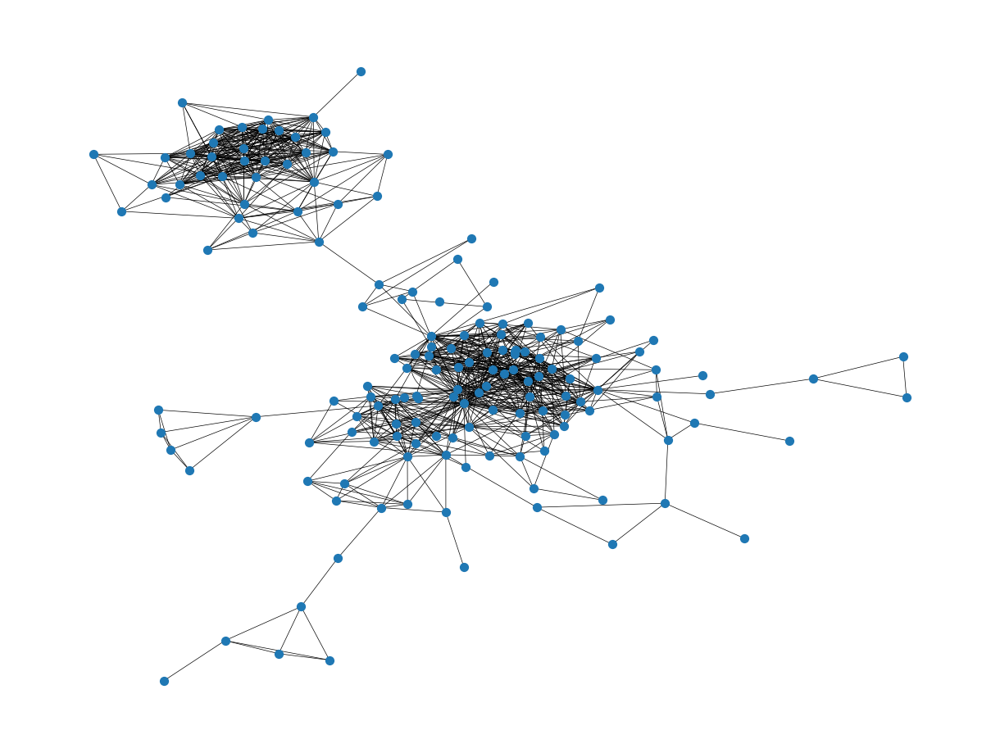

In [52]:
g.remove_node(central_users[CENTRAL_USED_ID])
graph_plot()

In [54]:
def graph_plot_save(name):
    plt.figure(figsize=(120, 90))
    nx.draw_kamada_kawai(g, with_labels=True, node_size=50, width=0.5)
    plt.savefig(name)

In [61]:
graph_plot_save('my_friends.png')

In [94]:
def get_id_list(token, user_id):
    fields = 'id, first_name, city, country'
    url = 'https://api.vk.com/method/friends.get?' + \
                        'access_token={}&user_id={}&fields={}&v=5.81'.format(token,user_id, fields)
    response = requests.get(url).json()
    if response.get('error'):
        return []
    return response.get('response').get('items')

In [229]:
list_of_friends = get_id_list(acess_token, CENTRAL_USED_ID)

for (index, friend) in enumerate(list_of_friends):
    if friend.get('city') == None:
        list_of_friends[index] = {
            'city': '',
       'first_name': friend.get('first_name'),
        'last_name': friend.get('last_name')   
    }
        continue
        
    list_of_friends[index] = {
            'city': friend.get('city').get('title'),
       'first_name': friend.get('first_name'),
        'last_name': friend.get('last_name')   
    }

In [230]:
list_of_friends

[{'city': 'Санкт-Петербург', 'first_name': 'Виталий', 'last_name': 'Милонов'},
 {'city': '', 'first_name': 'Денис', 'last_name': 'Матвеев'},
 {'city': 'Нарьян-Мар', 'first_name': 'Александра', 'last_name': 'Ардеева'},
 {'city': 'Санкт-Петербург', 'first_name': 'Катерина', 'last_name': 'Юшкова'},
 {'city': 'Липецк', 'first_name': 'Дмитрий', 'last_name': 'Самсонов'},
 {'city': 'Москва', 'first_name': 'Андрей', 'last_name': 'Белик'},
 {'city': 'Новокузнецк', 'first_name': 'Денис', 'last_name': 'Егоров'},
 {'city': '', 'first_name': 'Варвара', 'last_name': 'Николина'},
 {'city': '', 'first_name': 'Ислам', 'last_name': 'Закиров'},
 {'city': '', 'first_name': 'Вячеславик', 'last_name': 'Глухов'},
 {'city': 'Набережные Челны',
  'first_name': 'Надежда',
  'last_name': 'Анисимова'},
 {'city': 'Глазов', 'first_name': 'Данил', 'last_name': 'Горбушин'},
 {'city': 'Москва', 'first_name': 'Андрей', 'last_name': 'Мехоношин'},
 {'city': 'Балашиха', 'first_name': 'Антон', 'last_name': 'Косарев'},
 {'c

In [231]:
df = pd.DataFrame(list_of_friends)
df

,city,first_name,last_name
0,Санкт-Петербург,Виталий,Милонов
1,,Денис,Матвеев
2,Нарьян-Мар,Александра,Ардеева
3,Санкт-Петербург,Катерина,Юшкова
4,Липецк,Дмитрий,Самсонов
...,...,...,...
159,Балашиха,Роман,Борисов
160,,Елизавета,Маринина
161,,Аля,Уланова
162,Нижний Новгород,Фёдор,Казарин


In [232]:
df.to_csv('out.csv')

In [213]:
pip install requests

Note: you may need to restart the kernel to use updated packages.


In [233]:
API_KEY = 'ed392388-8128-484e-b501-d8ad2be8b053'

In [234]:
def coords(list):
    url = 'https://geocode-maps.yandex.ru/1.x?' + \
                        'apikey={}&geocode={}&format={}&results={}'.format(API_KEY, city, 'json', 1)
    response = requests.get(url).json()
    if response.get('error'):
        return ''
    return response.get('response')\
                   .get('GeoObjectCollection')\
                   .get('featureMember')[0]\
                   .get('GeoObject')\
                   .get('Point').get('pos')

In [249]:
cities = []
for friend in list_of_friends:
    cities.append('Россия, ' + friend.get('city'))
cities = set(cities)
cities_with_coords = {}
for city in cities:
    cities_with_coords[city] = coords(city)

In [250]:
cities_with_coords

{'Россия, Архангельск': '40.515762 64.539911',
 'Россия, Саратов': '46.034266 51.533562',
 'Россия, Нарьян-Мар': '53.006926 67.63805',
 'Россия, Москва': '37.617698 55.755864',
 'Россия, Электросталь': '38.444858 55.78445',
 'Россия, Липецк': '39.599229 52.608826',
 'Россия, Астана / Нур-Султан': '60.588914 41.36262',
 'Россия, Новокузнецк': '87.136053 53.757553',
 'Россия, Набережные Челны': '52.403662 55.741272',
 'Россия, Ижевск': '53.2069 56.852676',
 'Россия, Мытищи': '37.736743 55.909968',
 'Россия, Железнодорожный': '58.322482 53.928005',
 'Россия, Балашиха': '37.938118 55.797007',
 'Россия, Глазов': '52.674253 58.140801',
 'Россия, Курск': '36.193015 51.730846',
 'Россия, Новый Рай': '35.293056 52.636264',
 'Россия, Калининград': '20.510137 54.710162',
 'Россия, Санкт-Петербург': '30.314494 59.938676',
 'Россия, Нижний Новгород': '44.006516 56.326797',
 'Россия, Минеральные Воды': '43.13834 44.208806',
 'Россия, ': '99.505405 61.698657',
 'Россия, Чертаново': '35.92397 55.90291

In [257]:
cities_c = {}
for city in cities_with_coords.keys():
    coord_arr = cities_with_coords.get(city).split()
    coord_arr.reverse()
    city_coord = ', '.join(coord_arr)
    cities_c[city.split('Россия, ')[1]] = '[' + city_coord + ']'

In [258]:
for friend in list_of_friends:
    friend['city_coord'] = cities_c.get(friend.get('city'))
list_of_friends

[{'city': 'Санкт-Петербург',
  'first_name': 'Виталий',
  'last_name': 'Милонов',
  'city_coord': '[59.938676, 30.314494]'},
 {'city': '',
  'first_name': 'Денис',
  'last_name': 'Матвеев',
  'city_coord': '[61.698657, 99.505405]'},
 {'city': 'Нарьян-Мар',
  'first_name': 'Александра',
  'last_name': 'Ардеева',
  'city_coord': '[67.63805, 53.006926]'},
 {'city': 'Санкт-Петербург',
  'first_name': 'Катерина',
  'last_name': 'Юшкова',
  'city_coord': '[59.938676, 30.314494]'},
 {'city': 'Липецк',
  'first_name': 'Дмитрий',
  'last_name': 'Самсонов',
  'city_coord': '[52.608826, 39.599229]'},
 {'city': 'Москва',
  'first_name': 'Андрей',
  'last_name': 'Белик',
  'city_coord': '[55.755864, 37.617698]'},
 {'city': 'Новокузнецк',
  'first_name': 'Денис',
  'last_name': 'Егоров',
  'city_coord': '[53.757553, 87.136053]'},
 {'city': '',
  'first_name': 'Варвара',
  'last_name': 'Николина',
  'city_coord': '[61.698657, 99.505405]'},
 {'city': '',
  'first_name': 'Ислам',
  'last_name': 'Закиро

In [259]:
df_with_coords = pd.DataFrame(list_of_friends)
df_with_coords

,city,first_name,last_name,city_coord
0,Санкт-Петербург,Виталий,Милонов,"[59.938676, 30.314494]"
1,,Денис,Матвеев,"[61.698657, 99.505405]"
2,Нарьян-Мар,Александра,Ардеева,"[67.63805, 53.006926]"
3,Санкт-Петербург,Катерина,Юшкова,"[59.938676, 30.314494]"
4,Липецк,Дмитрий,Самсонов,"[52.608826, 39.599229]"
...,...,...,...,...
159,Балашиха,Роман,Борисов,"[55.797007, 37.938118]"
160,,Елизавета,Маринина,"[61.698657, 99.505405]"
161,,Аля,Уланова,"[61.698657, 99.505405]"
162,Нижний Новгород,Фёдор,Казарин,"[56.326797, 44.006516]"


## <https://datalens.yandex/jriktd5fcbrw8> ##


# Part3 #

In [318]:
ufa = []

In [319]:
def ufa_users(token, fields, status, religion):
    url = 'https://api.vk.com/method/users.search?' + \
                        'access_token={}&count={}&fields={}&status={}&religion={}&hometown={}&v=5.81'.format(token, 500, fields, status, religion, 'Уфа')
    print(requests.get(url).json())
    response = requests.get(url).json()
    if response.get('error'):
        return []
    users = response.get('response').get('items')
    time.sleep(random.randint(10, 20) / 100)
    return users

In [320]:
statuses = [0, 1, 2, 3, 4, 5, 6, 7, 8]
religions = ['', 'Иудаизм', 'Православие', 'Ислам', 'Пастафарианство', 'Светский гуманизм']
fields = 'first_name,last_name,bdate,sex'
for status in statuses:
    for religion in religions:
        if len(ufa) > 10000:
            break
        ufa.extend(ufa_users(acess_token, fields, status, religion))

    

{'response': {'count': 794650, 'items': [{'id': 221787814, 'bdate': '26.4.2005', 'track_code': '72593e1cyxOgqrl8qWwh75EsURHOk2Mz6yDMgw9pLVPibvMU9vqserDx4Eypa3LoqJz_xG6XCz3tI8yDAQ9fOg', 'sex': 1, 'first_name': 'Виталия', 'last_name': 'Алексеева'}, {'id': 143199615, 'bdate': '15.4', 'track_code': 'c5ddd4eeCdSz1MvX5uID9b6JEoJl39RjmqlhkvYCtBhOaBXBtQRuvfjWluvvtQDxhTeyV8TbvG2cqmGS-GTGcQ', 'sex': 1, 'first_name': 'Эмилия', 'last_name': 'Юлдашева'}, {'id': 213052708, 'bdate': '15.10.2004', 'track_code': 'baf35c13iHYJSgnSKjHW3sObtswj6xNvmm25wrGPZs5UJx9jL3TvH0hMAu97YYHb9S4XGI_ve2GcbrnCv-kUpw', 'sex': 1, 'first_name': 'Эллина', 'last_name': 'Гарипова'}, {'id': 91505510, 'bdate': '20.4', 'track_code': '0cec79892xAQETHDL5EkOHrp96PSdFy30bQdCkLrkD_w4BdZDzu8eQNFO_8hmCQ_S1tQd0AbOKrOuQp4TI3i', 'sex': 1, 'first_name': 'Света', 'last_name': 'Анненкова'}, {'id': 695384429, 'bdate': '14.1.2008', 'track_code': 'd4648c2aBOso5dJ8tYSaEzgjzyGhh0yNDmfX7taM04RIk_0_E-ljgmK_iEbg3p9BBZBt9wyDJIMIZNfu2Oqh7Q', 'sex': 1,

In [321]:
len(ufa)

10009

In [324]:
df_ufa = pd.DataFrame(ufa)
df_ufa

,id,bdate,track_code,sex,first_name,last_name
0,221787814,26.4.2005,2fd706caIhizmu3i6VgsFiB_owbRrN7SyFTq03yFNRvQk5...,1,Виталия,Алексеева
1,143199615,15.4,47e4e9121AMAW4sNCLGX9yAXaFdQHZZSdjB-4Q1LqyYRaW...,1,Эмилия,Юлдашева
2,213052708,15.10.2004,849d46bbq8_42fIoTuYLjqdKY_5RJV9BfC4SkyOaadiGiW...,1,Эллина,Гарипова
3,91505510,20.4,f4acfff8m75muLxtSWzZb0jX6ZHTQXpaFiv6O2U9JOJe08...,1,Света,Анненкова
4,695384429,14.1.2008,b3ea735ayzI3ynQ5uQg-j1imGWwFZF4yZh9_G6a_tX3aN8...,1,Сабина,Рашнрэп
...,...,...,...,...,...,...
10004,642117716,9.11,42ac35e4i4N_yb4EJcOhTEwC8GOy4lqNkvYa2Cetfl0w0B...,2,Емельян,Сафонов
10005,364602801,NaN,bb57e395o9z843n4FrGGNhcDxS_0wuBDIhgP1jtzG5_v4Z...,1,Надежда,Щеблыкина
10006,198040883,11.11,2d0f5e3cwXaNKqtcEqhvlnBshLh9u-5vVf4BP7fOmCP72m...,2,Лев,Абалкин
10007,330907869,10.5.1994,7567edcfjpYRYGPtemx9Cyb8Th6pEvccKBE8Qh25Ih1N1G...,2,Даниил,Азанов


## https://datalens.yandex/jriktd5fcbrw8 ##

In [325]:
df_ufa.to_csv('ufa.csv')